In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [2]:
df = pd.read_csv("waterQualityPrediction.csv")

In [3]:
df.shape

(7999, 21)

In [4]:
df

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


In [5]:
df.head(10)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
5,0.94,14.47,0.03,2.88,0.003,0.80,0.43,1.38,0.11,0.67,...,0.135,9.75,1.89,0.006,27.17,5.42,0.08,0.19,0.02,1
6,2.36,5.6,0.01,1.35,0.004,1.28,0.62,1.88,0.33,0.13,...,0.021,18.60,1.78,0.007,45.34,2.84,0.10,0.24,0.08,0
7,3.93,19.87,0.04,0.66,0.001,6.22,0.10,1.86,0.86,0.16,...,0.197,13.65,1.81,0.001,53.35,7.24,0.08,0.08,0.07,0
8,0.60,24.58,0.01,0.71,0.005,3.14,0.77,1.45,0.98,0.35,...,0.167,14.66,1.84,0.004,23.43,4.99,0.08,0.25,0.08,1
9,0.22,16.76,0.02,1.37,0.007,6.40,0.49,0.82,1.24,0.83,...,0.109,4.79,1.46,0.010,30.42,0.08,0.03,0.31,0.01,1


In [6]:
df.tail(10)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
7989,0.01,27.73,0.06,0.77,0.09,0.20,0.03,0.00,0.58,0.0,...,0.112,11.74,1.0,0.007,7.58,7.21,0.07,0.04,0.09,0
7990,0.00,3.11,0.07,1.24,0.07,0.06,0.03,0.04,0.74,0.0,...,0.016,15.15,1.0,0.005,0.46,6.24,0.03,0.09,0.05,0
7991,0.03,8.94,0.02,1.25,0.08,0.22,0.02,0.05,0.71,0.0,...,0.112,11.97,1.0,0.001,7.18,1.73,0.00,0.04,0.06,1
7992,0.04,10.84,0.06,0.49,0.04,0.08,0.03,0.08,0.49,0.0,...,0.151,14.44,1.0,0.003,0.34,2.16,0.06,0.03,0.05,1
7993,0.02,5.24,0.05,0.77,0.02,0.57,0.04,0.03,0.15,0.0,...,0.085,19.41,1.0,0.001,1.68,3.55,0.05,0.07,0.07,1
7994,0.05,7.78,0.00,1.95,0.04,0.10,0.03,0.03,1.37,0.0,...,0.197,14.29,1.0,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.01,0.45,0.02,0.02,1.48,0.0,...,0.031,10.27,1.0,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.03,0.05,0.05,0.02,0.91,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.00,2.00,0.00,0.09,0.00,0.0,...,0.000,0.00,0.0,0.000,0.00,0.00,0.00,0.00,0.00,1
7998,0.04,6.85,0.01,0.70,0.03,0.05,0.01,0.03,1.00,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1


In [7]:
df.shape

(7999, 21)

In [8]:
df.columns

Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

In [10]:
df = df[df['ammonia'] != '#NUM!']

In [11]:
df['ammonia'] = df['ammonia'].astype('float')
df['is_safe'] = df['is_safe'].astype('int')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7996 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7996 non-null   float64
 1   ammonia      7996 non-null   float64
 2   arsenic      7996 non-null   float64
 3   barium       7996 non-null   float64
 4   cadmium      7996 non-null   float64
 5   chloramine   7996 non-null   float64
 6   chromium     7996 non-null   float64
 7   copper       7996 non-null   float64
 8   flouride     7996 non-null   float64
 9   bacteria     7996 non-null   float64
 10  viruses      7996 non-null   float64
 11  lead         7996 non-null   float64
 12  nitrates     7996 non-null   float64
 13  nitrites     7996 non-null   float64
 14  mercury      7996 non-null   float64
 15  perchlorate  7996 non-null   float64
 16  radium       7996 non-null   float64
 17  selenium     7996 non-null   float64
 18  silver       7996 non-null   float64
 19  uranium    

/var/folders/f5/m2jr80hj1q92srd43m18_smh0000gn/T/ipykernel_6984/3124380394.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ammonia'] = df['ammonia'].astype('float')
/var/folders/f5/m2jr80hj1q92srd43m18_smh0000gn/T/ipykernel_6984/3124380394.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['is_safe'] = df['is_safe'].astype('int')


In [12]:
df.rename(columns={'is_safe': 'potability'}, inplace=True)

/var/folders/f5/m2jr80hj1q92srd43m18_smh0000gn/T/ipykernel_6984/22397539.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'is_safe': 'potability'}, inplace=True)


In [13]:
df

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,potability
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10.00,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


# Checking NULL values

In [14]:
df.isnull().sum()

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
potability     0
dtype: int64

There are no null values in this dataset

<Axes: >

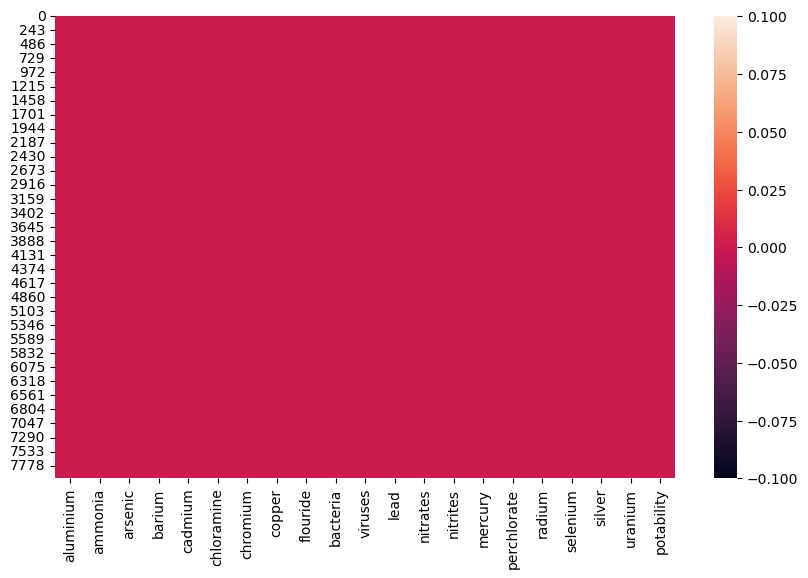

In [15]:
plt.figure(figsize = (10,6))
sns.heatmap(df.isnull())

there are no null values in this dataset

# Handling of Outliers

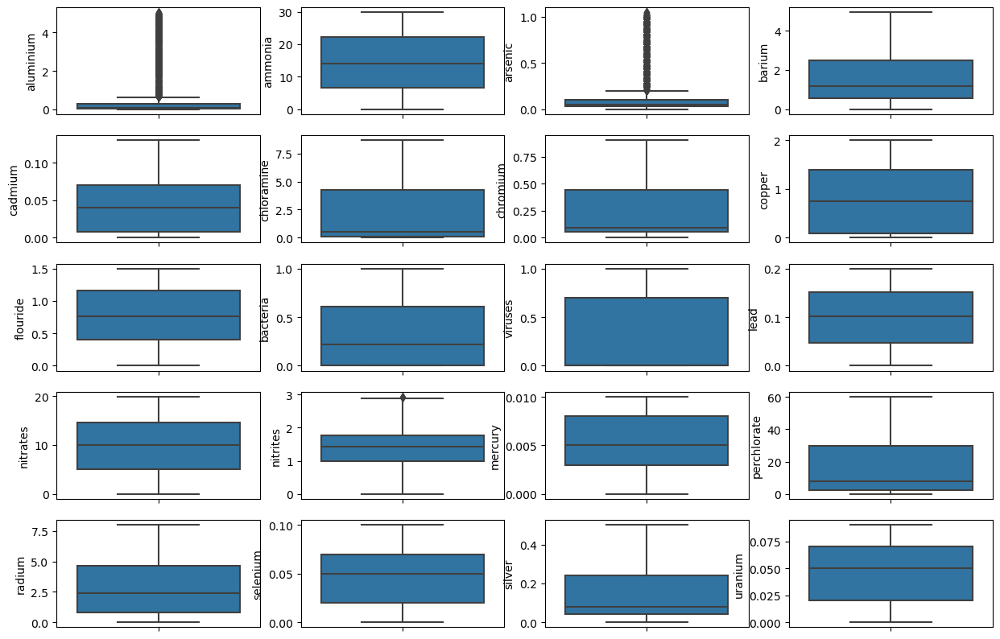

In [16]:
fig, ax = plt.subplots(5, 4, figsize=(15,10))  # Adjust the size as needed
index = 0
for col, values in df.items():
    if index < len(ax.flat):
        sns.boxplot(y=col, data=df, ax=ax.flat[index])
        index += 1
    else:
        break 

In [17]:
x= np.quantile(df['aluminium'],[0.25,0.75])
iqr = x[1]-x[0]
uw = x[1] + 1.5 * iqr
lw = x[0] - 1.5 * iqr

In [18]:
df['aluminium'] = np.where(df['aluminium']>uw,uw,(np.where(df['aluminium']<lw,lw,df['aluminium'])))


/var/folders/f5/m2jr80hj1q92srd43m18_smh0000gn/T/ipykernel_6984/1529595480.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['aluminium'] = np.where(df['aluminium']>uw,uw,(np.where(df['aluminium']<lw,lw,df['aluminium'])))


In [19]:
x= np.quantile(df['arsenic'],[0.25,0.75])
iqr = x[1]-x[0]
uw = x[1] + 1.5 * iqr
lw = x[0] - 1.5 * iqr

In [20]:
df['arsenic'] = np.where(df['arsenic']>uw,uw,(np.where(df['arsenic']<lw,lw,df['arsenic'])))

/var/folders/f5/m2jr80hj1q92srd43m18_smh0000gn/T/ipykernel_6984/4159036609.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['arsenic'] = np.where(df['arsenic']>uw,uw,(np.where(df['arsenic']<lw,lw,df['arsenic'])))


In [21]:
x= np.quantile(df['nitrites'],[0.25,0.75])
iqr = x[1]-x[0]
uw = x[1] + 1.5 * iqr
lw = x[0] - 1.5 * iqr

In [22]:
df['nitrites'] = np.where(df['nitrites']>uw,uw,(np.where(df['nitrites']<lw,lw,df['nitrites'])))

/var/folders/f5/m2jr80hj1q92srd43m18_smh0000gn/T/ipykernel_6984/570264215.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['nitrites'] = np.where(df['nitrites']>uw,uw,(np.where(df['nitrites']<lw,lw,df['nitrites'])))


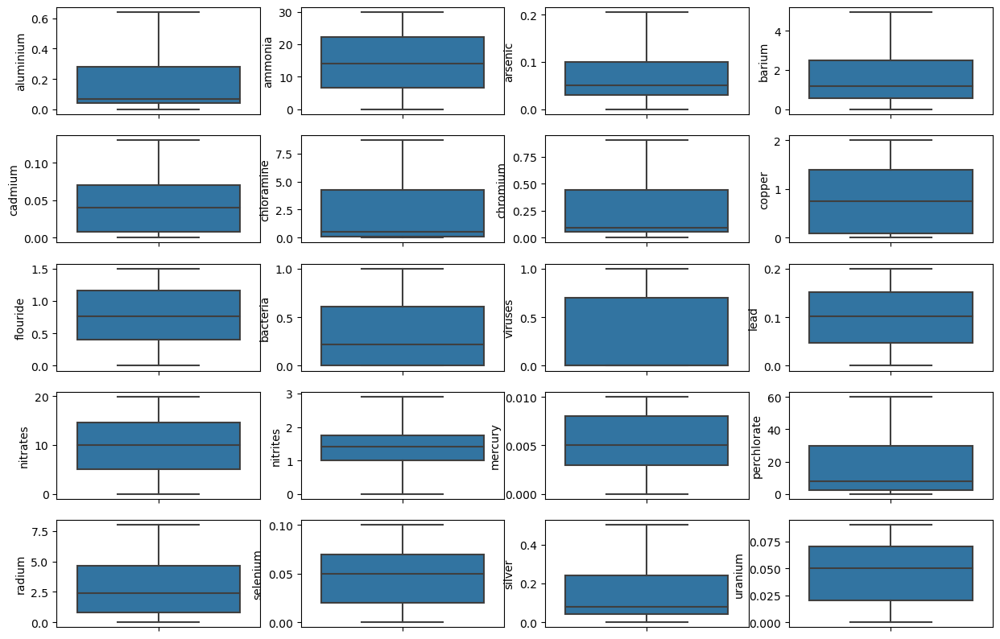

In [23]:
fig, ax = plt.subplots(5, 4, figsize=(15,10))  # Adjust the size as needed
index = 0
for col, values in df.items():
    if index < len(ax.flat):
        sns.boxplot(y=col, data=df, ax=ax.flat[index])
        index += 1
    else:
        break 

outliers has been handled

In [24]:
df.columns


Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'potability'],
      dtype='object')

# Data Visualizations

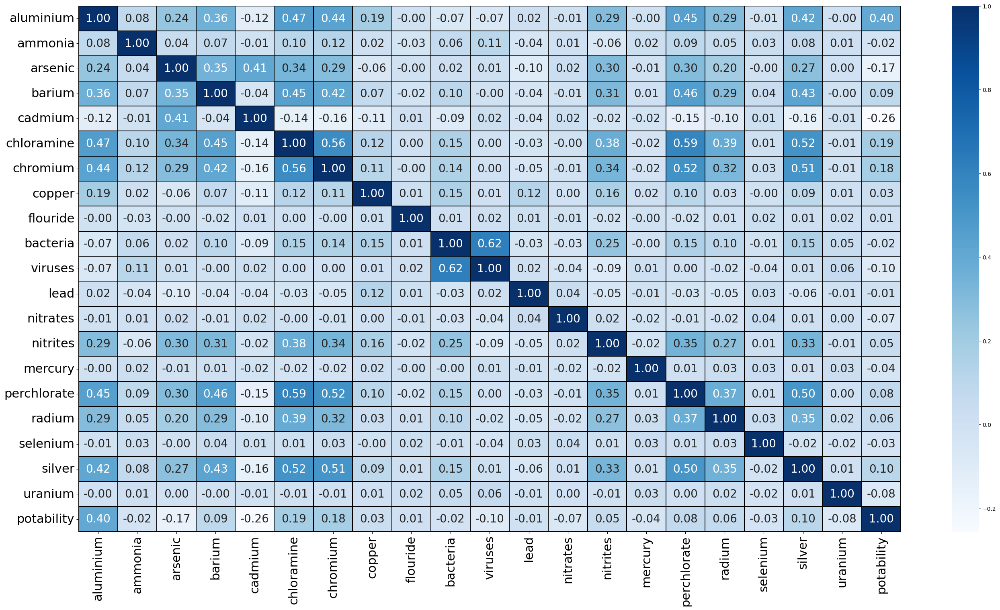

In [25]:
plt.figure(figsize = (33,17))
corr = df.corr()
sns.heatmap(corr, annot = True, cmap = 'Blues', linewidths = 0.01, linecolor = 'black',
            fmt = '0.2f', annot_kws = {'fontsize' : 20})
plt.yticks(fontsize = 22, rotation = 0)
plt.xticks(fontsize = 22, rotation = 90)
plt.show()

In [26]:
fig = px.pie(df,names="potability",hole = 0.4,template = "plotly_dark")
fig.show()

/Users/preetham/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



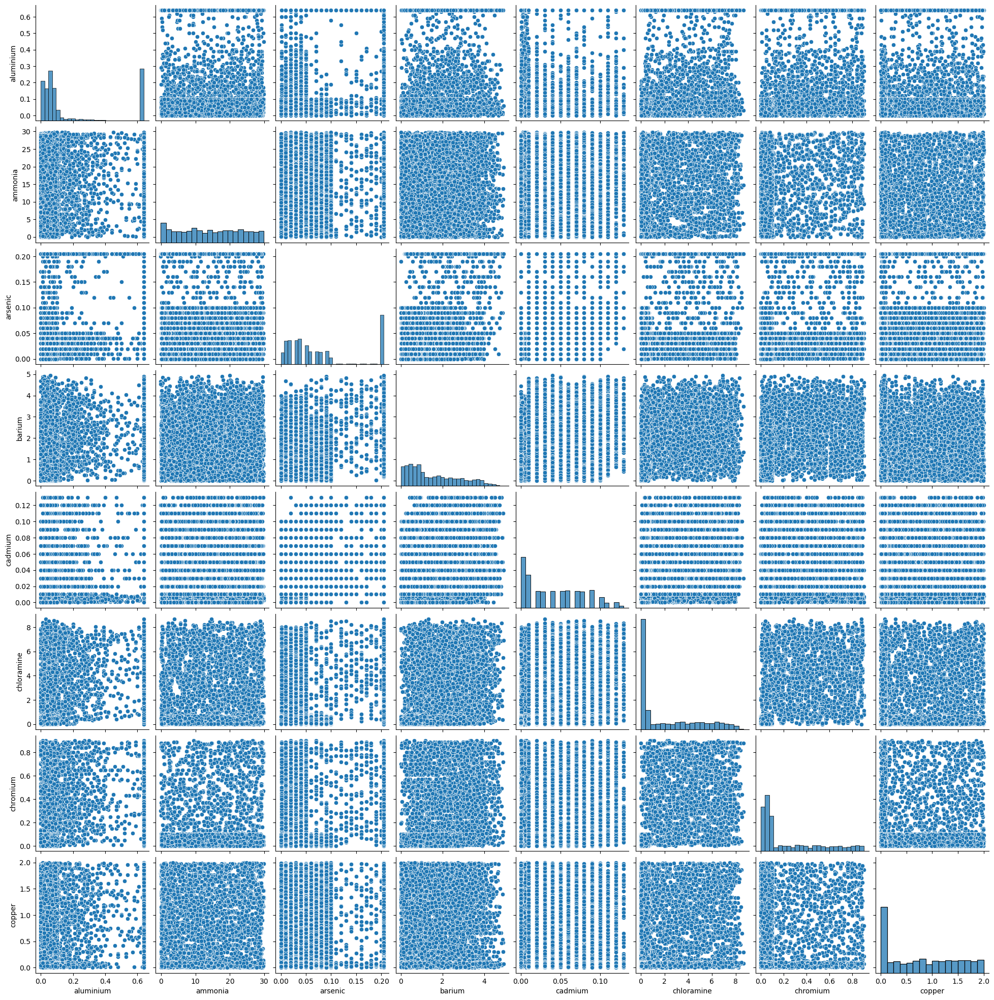

In [27]:
sns.pairplot(df[['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper']])

/Users/preetham/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



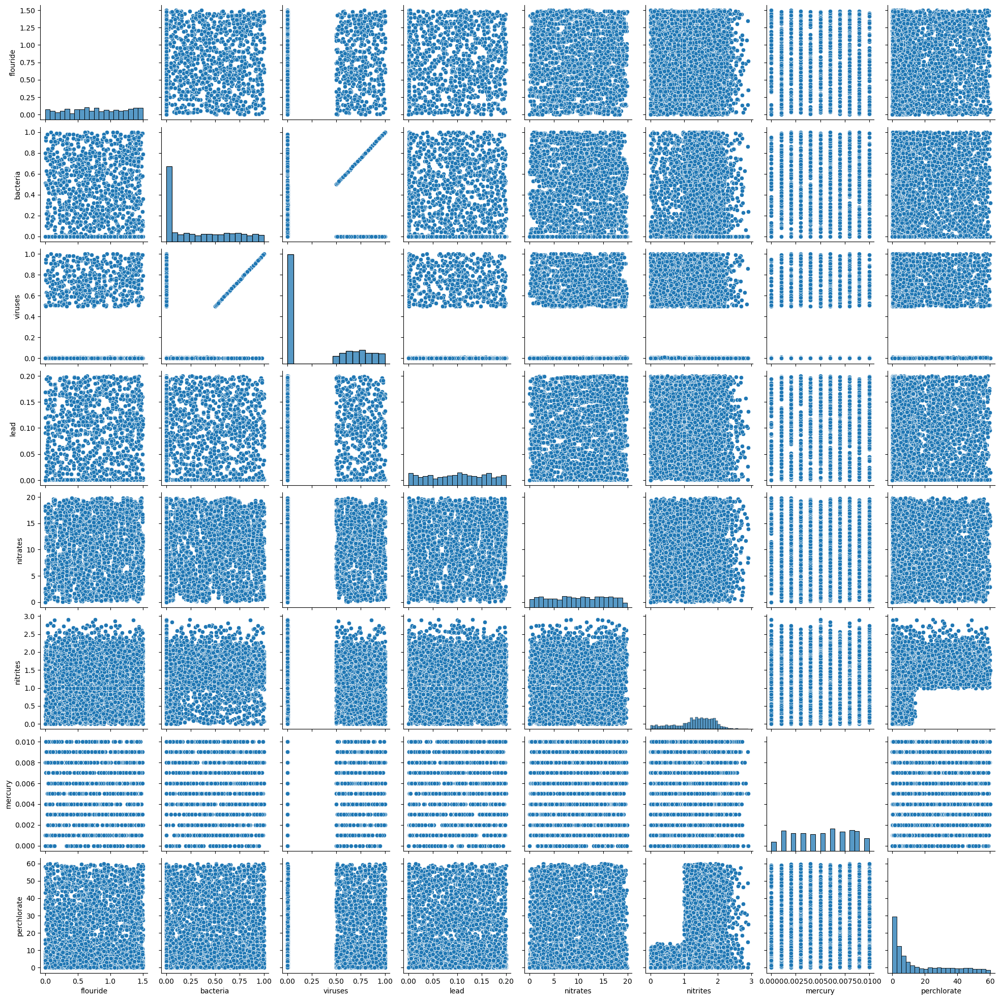

In [28]:
sns.pairplot(df[['flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'mercury', 'perchlorate']])

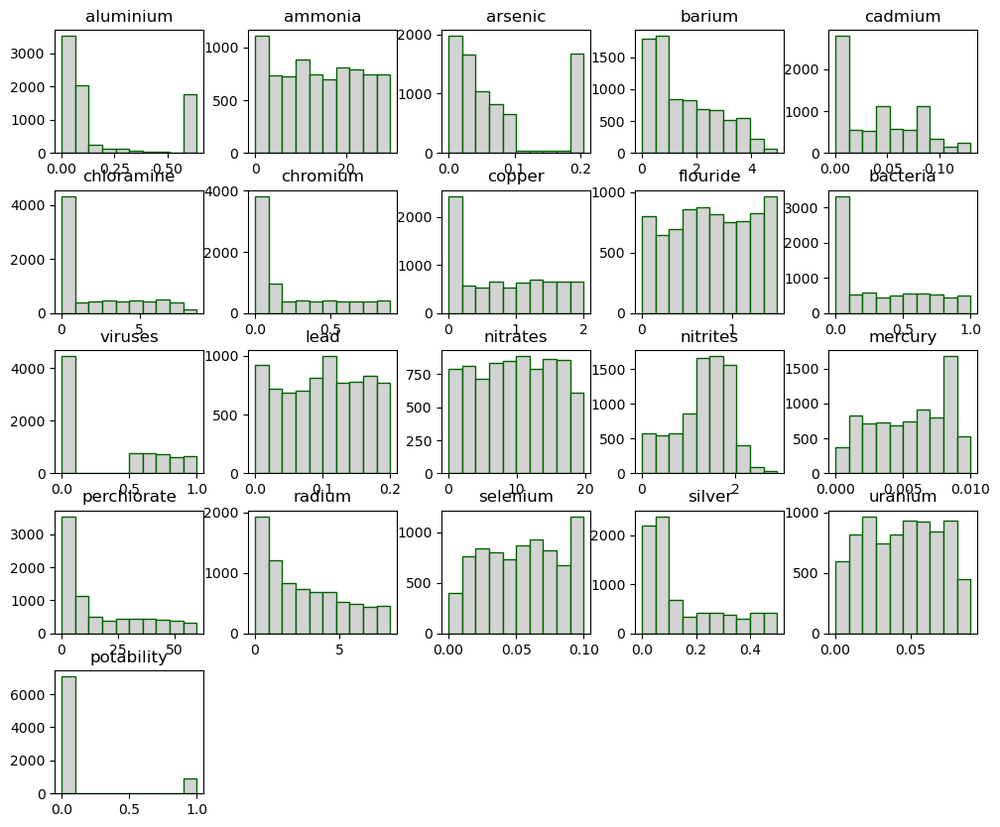

In [29]:
df.hist(grid = False, color = 'lightgrey', edgecolor = 'darkgreen', figsize = (12,10));

In [30]:
fig = px.scatter(df,x = "radium",y="arsenic",template = "plotly_dark")
fig.show()

In [31]:
fig = px.scatter(df,x = "nitrates",y="chromium",template= "plotly_dark")
fig.show()

In [32]:
fig = px.scatter(df,x = "barium",y="copper",template= "plotly_dark")
fig.show()

<Axes: xlabel='potability', ylabel='nitrites'>

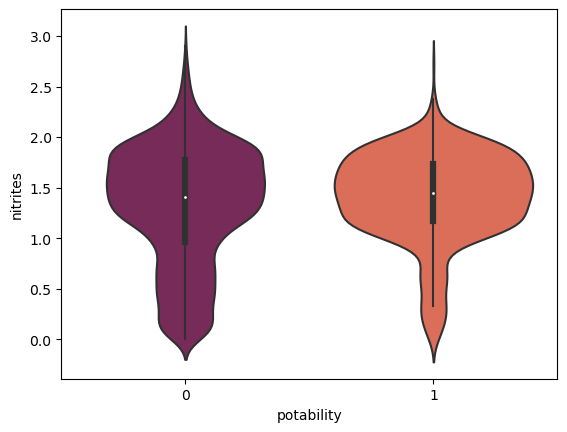

In [33]:
sns.violinplot(x='potability', y='nitrites', data=df, palette='rocket')

<Axes: xlabel='potability', ylabel='chromium'>

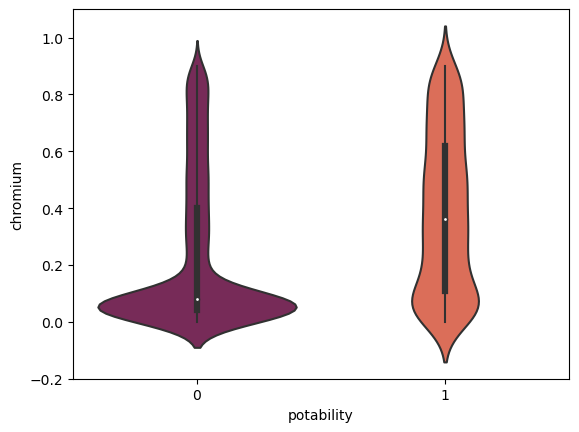

In [34]:
sns.violinplot(x='potability', y='chromium', data=df, palette='rocket')

In [35]:
fig = px.scatter(df,x = "nitrites",y="nitrates",color = "potability",template= "plotly_dark")
fig.show()

In [36]:
fig = px.scatter(df,x = "lead",y="chromium",color = "potability",template= "plotly_dark")
fig.show()

In [37]:
fig = px.scatter(df,x = "bacteria",y = "flouride",color = "potability")
fig.show()

In [38]:
fig = px.scatter(df,x = "chloramine",y = "viruses",color = "potability")
fig.show()

# Pre Processing of Data

In [39]:
x = df.drop("potability",axis=1)
y = df["potability"]

In [40]:
x.shape , y.shape

((7996, 20), (7996,))

In [41]:
scaler = StandardScaler()
x = scaler.fit_transform(x)
x

array([[ 1.80798204, -0.58549134, -0.54429631, ...,  1.05369443,
         1.33873624, -0.91704015],
       [ 1.80798204,  0.77511802, -0.96692141, ...,  1.05369443,
         0.85113427,  0.19802266],
       [ 1.80798204, -0.02908321, -0.54429631, ...,  0.70612871,
         2.03531047, -1.28872776],
       ...,
       [-0.44371383, -0.83666343, -1.10779644, ..., -1.72683135,
        -0.75098648,  0.19802266],
       [-0.77123323, -0.48186877, -0.96692141, ..., -1.72683135,
        -1.02961617, -1.66041536],
       [-0.64841345, -0.83666343, -0.96692141, ..., -1.72683135,
        -0.75098648,  0.19802266]])

In [42]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state = 42)

In [43]:
x_train.shape , x_test.shape

((6396, 20), (1600, 20))

# Logistic Regression

In [44]:
from sklearn.linear_model import LogisticRegression

model_lr = LogisticRegression()

In [45]:
model_lr.fit(x_train,y_train)

LogisticRegression()

In [46]:
pred_lr = model_lr.predict(x_test)

In [47]:
accuracy_score_lr = accuracy_score(y_test,pred_lr)
accuracy_score_lr*100

92.25

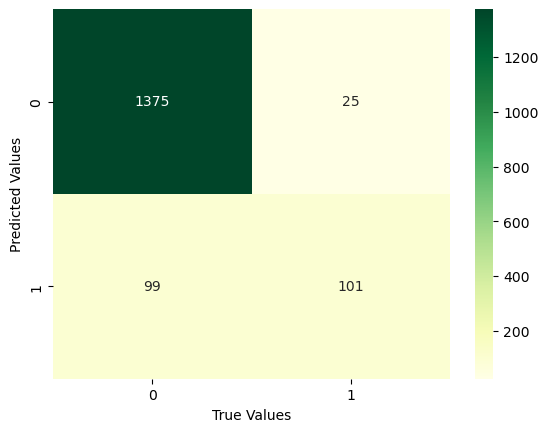

In [48]:
sns.heatmap((confusion_matrix(y_test,pred_lr)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [49]:
print(classification_report(y_test, pred_lr))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96      1400
           1       0.80      0.51      0.62       200

    accuracy                           0.92      1600
   macro avg       0.87      0.74      0.79      1600
weighted avg       0.92      0.92      0.91      1600



# Decision Tree Classifier

In [50]:
from sklearn.tree import DecisionTreeClassifier

model_dt = DecisionTreeClassifier(max_depth = 4)

In [51]:
model_dt.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=4)

In [52]:
pred_dt = model_dt.predict(x_test)

In [53]:
accuracy_score_dt = accuracy_score(y_test,pred_dt)
accuracy_score_dt*100

94.6875

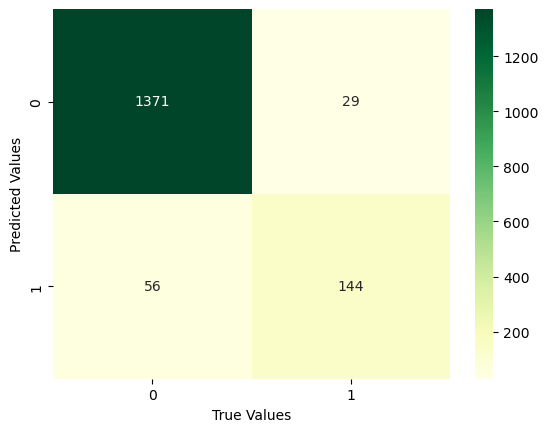

In [54]:
sns.heatmap((confusion_matrix(y_test,pred_dt)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [55]:
print(classification_report(y_test, pred_dt))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1400
           1       0.83      0.72      0.77       200

    accuracy                           0.95      1600
   macro avg       0.90      0.85      0.87      1600
weighted avg       0.94      0.95      0.95      1600



# Random Forest Classifier

In [56]:
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier()

In [57]:
model_rf.fit(x_train,y_train)

RandomForestClassifier()

In [58]:
pred_rf = model_rf.predict(x_test)

In [59]:
accuracy_score_rf = accuracy_score(y_test,pred_rf)
accuracy_score_rf*100

95.9375

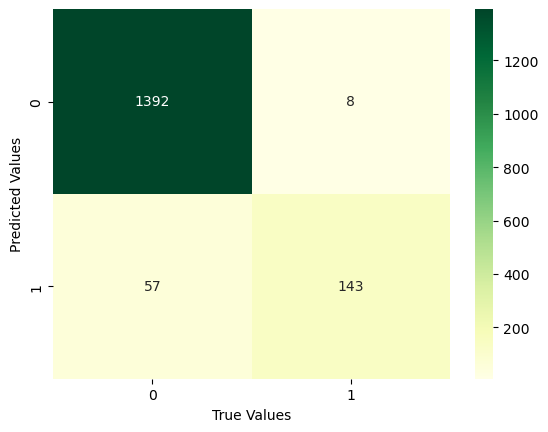

In [60]:
sns.heatmap((confusion_matrix(y_test,pred_rf)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [61]:
print(classification_report(y_test, pred_rf))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98      1400
           1       0.95      0.71      0.81       200

    accuracy                           0.96      1600
   macro avg       0.95      0.85      0.90      1600
weighted avg       0.96      0.96      0.96      1600



# KNN --- K-Nearest-Neighbours

In [62]:
from sklearn.neighbors import KNeighborsClassifier

model_knn = KNeighborsClassifier()

In [63]:
for i in range(4,11):
    model_knn = KNeighborsClassifier(n_neighbors=i)
    model_knn.fit(x_train,y_train)
    pred_knn = model_knn.predict(x_test)
    accuracy_score_knn = accuracy_score(y_test,pred_knn)
    print(i,accuracy_score_knn)

4 0.9075
5 0.92125
6 0.91375
7 0.9225
8 0.92
9 0.926875
10 0.916875


In [64]:
model_knn = KNeighborsClassifier(n_neighbors=8)
model_knn.fit(x_train,y_train)
pred_knn = model_knn.predict(x_test)
accuracy_score_knn = accuracy_score(y_test,pred_knn)
print(accuracy_score_knn*100)

92.0


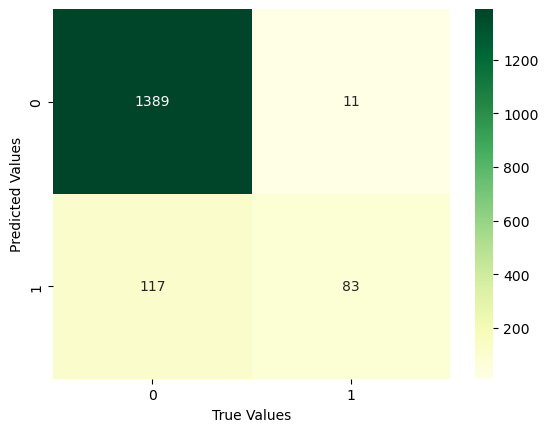

In [65]:
sns.heatmap((confusion_matrix(y_test,pred_knn)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [66]:
print(classification_report(y_test, pred_knn))

              precision    recall  f1-score   support

           0       0.92      0.99      0.96      1400
           1       0.88      0.41      0.56       200

    accuracy                           0.92      1600
   macro avg       0.90      0.70      0.76      1600
weighted avg       0.92      0.92      0.91      1600



# Support Vector Machine

In [67]:
from sklearn.svm import SVC

model_svm = SVC(kernel="rbf")

In [68]:
model_svm.fit(x_train,y_train)

SVC()

In [69]:
pred_svm = model_svm.predict(x_test)

In [70]:
accuracy_score_svm = accuracy_score(y_test,pred_svm)
accuracy_score_svm*100

94.8125

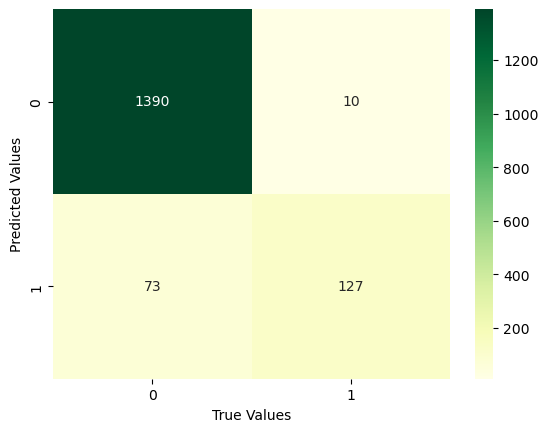

In [71]:
sns.heatmap((confusion_matrix(y_test,pred_svm)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [72]:
print(classification_report(y_test, pred_svm))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1400
           1       0.93      0.64      0.75       200

    accuracy                           0.95      1600
   macro avg       0.94      0.81      0.86      1600
weighted avg       0.95      0.95      0.94      1600



# AdaBoost Classifiers

In [73]:
from sklearn.ensemble import AdaBoostClassifier

model_ada = AdaBoostClassifier(n_estimators=200,learning_rate=0.03)

In [74]:
model_ada.fit(x_train,y_train)

AdaBoostClassifier(learning_rate=0.03, n_estimators=200)

In [75]:
pred_ada = model_ada.predict(x_test)

In [76]:
accuracy_score_ada = accuracy_score(y_test,pred_ada)
accuracy_score_ada*100

89.0625

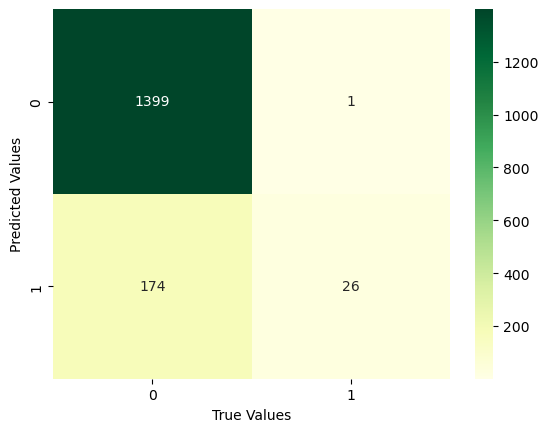

In [77]:
sns.heatmap((confusion_matrix(y_test,pred_ada)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [78]:
print(classification_report(y_test, pred_ada))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94      1400
           1       0.96      0.13      0.23       200

    accuracy                           0.89      1600
   macro avg       0.93      0.56      0.59      1600
weighted avg       0.90      0.89      0.85      1600



# XGBooST Classifier

In [79]:
from xgboost import XGBClassifier

model_xgb = XGBClassifier(n_estimators=100,learning_rate=0.03)

In [80]:
model_xgb.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.03, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [81]:
pred_xgb = model_xgb.predict(x_test)

In [82]:
accuracy_score_xgb = accuracy_score(y_test,pred_xgb)
accuracy_score_xgb*100

97.0625

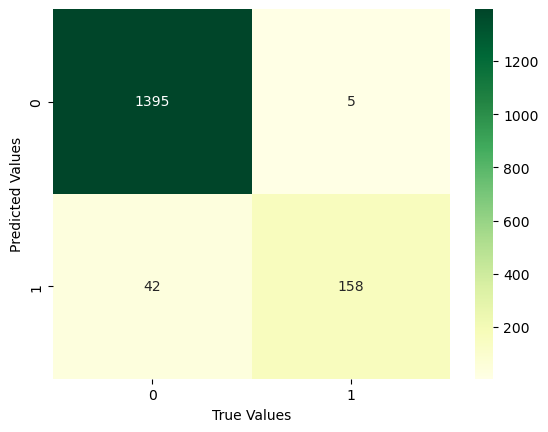

In [83]:
sns.heatmap((confusion_matrix(y_test,pred_xgb)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [84]:
print(classification_report(y_test, pred_xgb))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1400
           1       0.97      0.79      0.87       200

    accuracy                           0.97      1600
   macro avg       0.97      0.89      0.93      1600
weighted avg       0.97      0.97      0.97      1600



# Gaussian Naïve Bayes

In [85]:
from sklearn.naive_bayes import GaussianNB

model_gnb = GaussianNB()

In [86]:
model_gnb.fit(x_train,y_train)

GaussianNB()

In [87]:
pred_gnb = model_gnb.predict(x_test)

In [88]:
accuracy_score_gnb = accuracy_score(y_test,pred_gnb)
accuracy_score_gnb*100

87.75

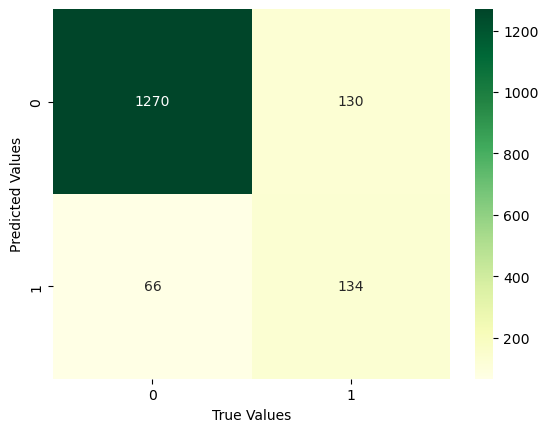

In [89]:
sns.heatmap((confusion_matrix(y_test,pred_gnb)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [90]:
print(classification_report(y_test, pred_gnb))

              precision    recall  f1-score   support

           0       0.95      0.91      0.93      1400
           1       0.51      0.67      0.58       200

    accuracy                           0.88      1600
   macro avg       0.73      0.79      0.75      1600
weighted avg       0.90      0.88      0.88      1600



# Gradient Boosting Classifier

In [91]:
from sklearn.ensemble import GradientBoostingClassifier
model_gbc = GradientBoostingClassifier(n_estimators=100,learning_rate=0.03)

In [92]:
model_gbc.fit(x_train,y_train)

GradientBoostingClassifier(learning_rate=0.03)

In [93]:
pred_gbc = model_gbc.predict(x_test)

In [94]:
accuracy_score_gbc = accuracy_score(y_test,pred_gbc)
accuracy_score_gbc*100

94.25

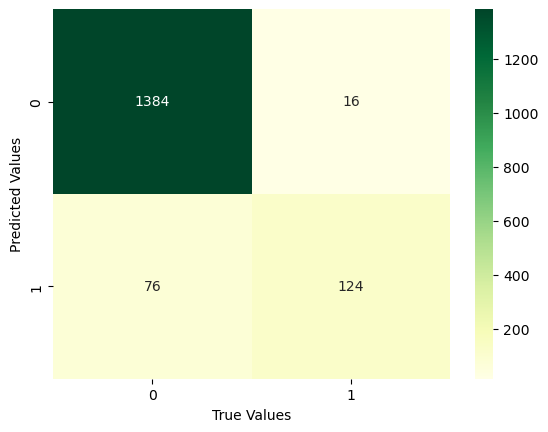

In [95]:
sns.heatmap((confusion_matrix(y_test,pred_gbc)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');

In [96]:
print(classification_report(y_test, pred_gbc))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1400
           1       0.89      0.62      0.73       200

    accuracy                           0.94      1600
   macro avg       0.92      0.80      0.85      1600
weighted avg       0.94      0.94      0.94      1600



# Model Accuracy

In [97]:
models = pd.DataFrame({
    "Model": ["Logistic Regression",
              "Decision Tree",
              "Random Forest",
              "KNN",
              "SVM",
              "AdaBoost",
              "XGBoosT",
              "GaussianNB",
              "GradientBoosting"],
    
    "Accuracy Score" : [accuracy_score_lr*100,accuracy_score_dt*100,accuracy_score_rf*100,accuracy_score_knn*100,accuracy_score_svm*100,accuracy_score_ada*100,accuracy_score_xgb*100,accuracy_score_gnb*100,accuracy_score_gbc*100]
    
})

In [98]:
models

,Model,Accuracy Score
0,Logistic Regression,92.2500
1,Decision Tree,94.6875
2,Random Forest,95.9375
3,KNN,92.0000
4,SVM,94.8125
5,AdaBoost,89.0625
6,XGBoosT,97.0625
7,GaussianNB,87.7500
8,GradientBoosting,94.2500


In [99]:
models.sort_values(by="Accuracy Score",ascending= False)

,Model,Accuracy Score
6,XGBoosT,97.0625
2,Random Forest,95.9375
4,SVM,94.8125
1,Decision Tree,94.6875
8,GradientBoosting,94.2500
0,Logistic Regression,92.2500
3,KNN,92.0000
5,AdaBoost,89.0625
7,GaussianNB,87.7500


<Axes: xlabel='Accuracy Score', ylabel='Model'>

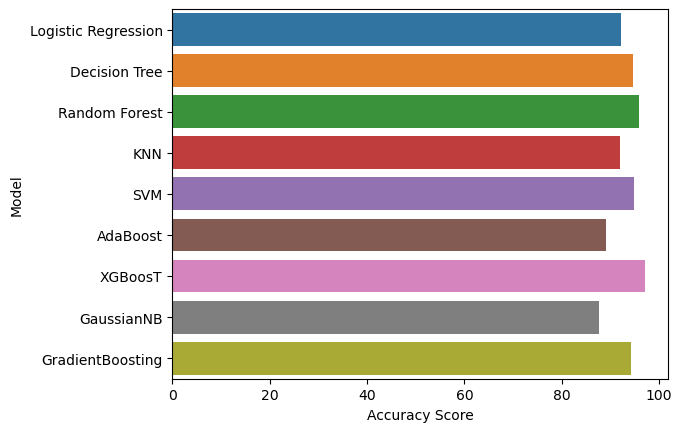

In [100]:
sns.barplot(x="Accuracy Score",y= "Model",data=models)

XGBoost Model is giving best accuracy score